# Download dataset

[link to dataset](https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/)

In [1]:
!wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-images.tgz
# !wget https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-human.tgz

--2025-05-19 06:55:02--  https://www2.eecs.berkeley.edu/Research/Projects/CS/vision/bsds/BSDS300-images.tgz
Resolving www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)... 128.32.244.190
Connecting to www2.eecs.berkeley.edu (www2.eecs.berkeley.edu)|128.32.244.190|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 22211847 (21M) [application/x-tar]
Saving to: ‘BSDS300-images.tgz’

BSDS300-images.tgz  100%[===================>]  21.18M  9.57MB/s    in 2.2s    

2025-05-19 06:55:05 (9.57 MB/s) - ‘BSDS300-images.tgz’ saved [22211847/22211847]



## download created dataset

[link to prepared dataset](https://drive.google.com/file/d/1hOyymWjHlMrVpP7ZVONtNt6ZDierTbDz/view?usp=drive_link)

In [2]:
!cp /content/drive/MyDrive/deep_learning_research/Image_Super_Resolution_Using_Deep_Convolutional_Networks/data/dataset.zip /content/

In [3]:
!tar -xvzf BSDS300-images.tgz
!unzip dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: dataset/test/3_10_170057_lr.jpg  
  inflating: dataset/test/19_11_65033_hr.jpg  
  inflating: dataset/test/15_9_253027_lr.jpg  
  inflating: dataset/test/23_11_54082_hr.jpg  
  inflating: dataset/test/0_29_42049_lr.jpg  
  inflating: dataset/test/6_26_14037_hr.jpg  
  inflating: dataset/test/15_11_86016_hr.jpg  
  inflating: dataset/test/9_17_108082_lr.jpg  
  inflating: dataset/test/18_26_147091_lr.jpg  
  inflating: dataset/test/6_12_376043_hr.jpg  
  inflating: dataset/test/22_11_89072_hr.jpg  
  inflating: dataset/test/27_15_101087_lr.jpg  
  inflating: dataset/test/16_7_291000_lr.jpg  
  inflating: dataset/test/17_8_89072_lr.jpg  
  inflating: dataset/test/25_8_271035_lr.jpg  
  inflating: dataset/test/23_5_148026_lr.jpg  
  inflating: dataset/test/5_20_123074_hr.jpg  
  inflating: dataset/test/8_29_143090_lr.jpg  
  inflating: dataset/test/19_5_197017_hr.jpg  
  inflating: dataset/test/20_8_260058_hr.jpg  
  inflatin

# Import

In [58]:
import tensorflow as tf
from tensorflow.keras import layers, Model, initializers

from tensorflow.keras.optimizers import Optimizer
from tensorflow.python.ops import math_ops
from tensorflow.python.ops import state_ops
from tensorflow.keras import ops
from tensorflow.keras.losses import Loss
from tensorflow.keras.metrics import Metric
import random

import seaborn as sns

import numpy as np
import matplotlib.pyplot as plt
import os
import cv2
import glob
from tqdm.autonotebook import tqdm


## prepare dataset

In [5]:
len(glob.glob("/content/dataset/train/*hr.jpg"))

134400

In [6]:
BUFFER_SIZE = int(len(glob.glob("/content/dataset/train/*lr.jpg"))/2)

BATCH_SIZE = 2048



In [7]:
# train_lr_images = glob.glob("/content/dataset/train/*lr.jpg")
# train_hr_images = glob.glob("/content/dataset/train/*hr.jpg")

# test_lr_images = glob.glob("/content/dataset/test/*lr.jpg")
# test_hr_images = glob.glob("/content/dataset/test/*hr.jpg")

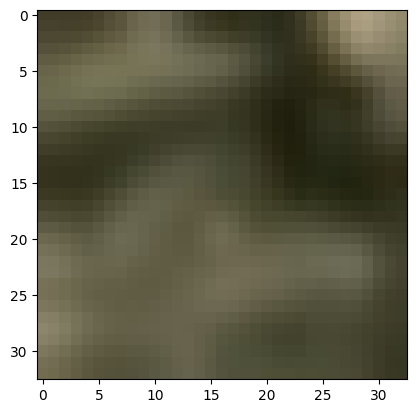

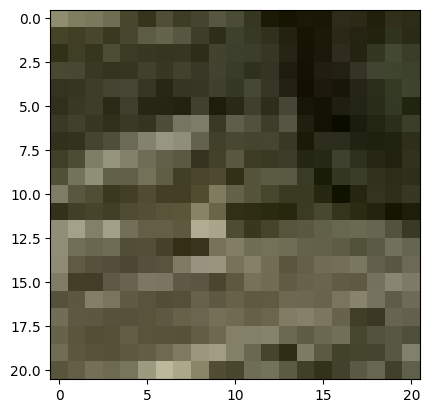

In [8]:
def load(lr_image_file):
    # Read and decode an image file to a uint8 tensor
    # pass only lr file paths

    hr_image_file = tf.strings.regex_replace(lr_image_file, "lr", "hr")

    image_lr = tf.io.read_file(lr_image_file)
    image_hr = tf.io.read_file(hr_image_file)


    image_lr = tf.io.decode_jpeg(image_lr)
    image_hr = tf.io.decode_jpeg(image_hr)


    image_hr = image_hr[6:-6,6:-6,:]

    image_lr = tf.cast(image_lr, tf.float32)
    image_hr = tf.cast(image_hr, tf.float32)


    return image_lr, image_hr

image_lr, image_hr = load("/content/dataset/train/14_10_33066_lr.jpg")
# Casting to int for matplotlib to display the images
plt.imshow(image_lr / 255.0)
plt.show()
plt.imshow(image_hr / 255.0)
plt.show()


In [9]:
# Normalizing the images to [0, 1]
def normalize(image_lr, image_hr):
    image_lr = (image_lr / 255.0)
    image_hr = (image_hr / 255.0)

    return image_lr, image_hr


In [10]:
@tf.function()
def random_jitter(image_lr, image_hr):

    if tf.random.uniform(()) > 0.5:
        # Random mirroring
        image_lr = tf.image.flip_left_right(image_lr)
        image_hr = tf.image.flip_left_right(image_hr)

    return image_lr, image_hr

In [11]:
def load_image_train(lr_image_file):
    image_lr, image_hr = load(lr_image_file)

    image_lr, image_hr = random_jitter(image_lr, image_hr)

    image_lr, image_hr = normalize(image_lr, image_hr)

    return image_lr, image_hr



In [12]:
def load_image_test(lr_image_file):
    image_lr, image_hr = load(lr_image_file)
    image_lr, image_hr = normalize(image_lr, image_hr)

    return image_lr, image_hr


In [13]:
train_dataset = tf.data.Dataset.list_files("/content/dataset/train/*lr.jpg")
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)
train_dataset = train_dataset.batch(BATCH_SIZE)

In [14]:
test_dataset = tf.data.Dataset.list_files("/content/dataset/test/*lr.jpg")
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)

## Prepare model

(array([ 1.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0.,  0.,  0.,  0.,  0.,  1.,  0.,  0.,  0.,  0.,  1.,  1.,
         0.,  1.,  3.,  1.,  2.,  0.,  1.,  2.,  2.,  1.,  2.,  2.,  3.,
         4.,  0.,  3.,  2.,  1.,  2.,  3.,  2.,  5.,  4.,  2.,  7.,  2.,
         2.,  5.,  5.,  8.,  4.,  6.,  4.,  6.,  5.,  1.,  7.,  5.,  7.,
        14., 15.,  5., 14., 14.,  8., 11., 18., 11., 15., 12., 17., 17.,
        18.,  9., 20., 14., 10., 13., 19., 15., 27., 26., 15., 27., 20.,
        19., 26., 15., 25., 25., 14., 23., 19., 25., 31., 18., 22., 22.,
        27., 31., 26., 23., 29., 24., 38., 30., 24., 31., 22., 21., 26.,
        27., 31., 24., 19., 33., 29., 14., 19., 19., 21., 15., 19., 24.,
        11., 31., 19., 22., 17., 14., 13., 17., 15., 13., 24., 19., 18.,
        14., 16., 11., 12., 15., 15., 13., 10.,  7., 12., 13.,  9., 12.,
         8.,  4.,  9., 14.,  2.,  3.,  7.,  6.,  7.,  7.,  3.,  4.,  6.,
         7.,  3.,  4.,  6.,  4.,  2.,  3.,  2.,  3.

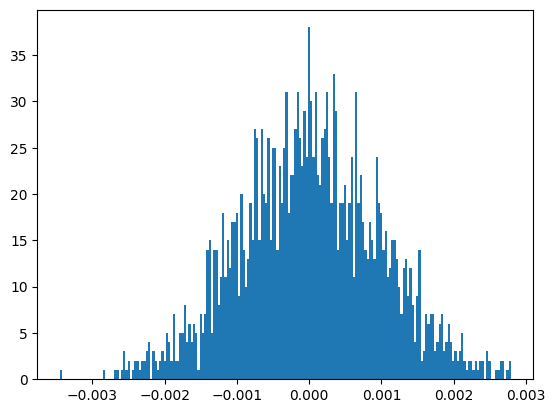

In [15]:
plt.hist(initializers.random_normal(mean=0.0,stddev=0.001,seed=42)(shape=(2000,)).numpy(),bins=200)

In [16]:

# {None, 'mean', 'sum_over_batch_size', 'none', 'mean_with_sample_weight', 'sum'}

class CustomMSELoss(Loss):

    def __init__(self, reduction="mean", name='custom_mse_loss'):
        super().__init__(reduction=reduction, name=name)

    def call(self, y_true, y_pred):
        """
        Computes the mean squared error between y_true and y_pred.

        Args:
            y_true: Ground truth values.  Shape = [BATCH_SIZE, length, width, channel].
            y_pred: The predicted values.  Shape = [BATCH_SIZE, length, width, channel].

        Returns:
            The mean squared error.  Shape = Scalar.
        """
        squared_difference = tf.square(y_true - y_pred)
        return tf.reduce_mean(squared_difference)



In [17]:
custom_mse_loss = CustomMSELoss()

y_true = tf.constant(np.random.rand(100,21,21,3)-0.2)
y_pred = tf.constant(np.random.rand(100,21,21,3)+0.2)
loss_value = custom_mse_loss(y_true, y_pred)
print(f"Custom MSE Loss class: {loss_value.numpy()}")

Custom MSE Loss class: 0.32597851753234863


In [18]:
class CustomOptimizer(Optimizer):
    def __init__(self, **kwargs):
        super().__init__(**kwargs)
        self.momentum = 0.9

    def build(self, variables):
        super().build(variables)
        self.momentums = []
        for variable in variables:
            self.momentums.append(
                self.add_variable_from_reference(
                    reference_variable=variable, name="momentum"
                )
            )

    def update_step(self, gradient, variable, learning_rate):
        learning_rate = ops.cast(learning_rate, variable.dtype)
        gradient = ops.cast(gradient, variable.dtype)
        m = self.momentums[self._get_variable_index(variable)]
        self.assign(
            m,
            ops.subtract(
                ops.multiply(m, ops.cast(self.momentum, variable.dtype)),
                ops.multiply(gradient, learning_rate),
            ),
        )
        self.assign_add(variable, m)

    def get_config(self):
        config = super().get_config()
        config.update(
            {
                "momentum": self.momentum,
                "nesterov": self.nesterov,
            }
        )
        return config

In [19]:
# class MeanSquaredError(Loss):
#     def call(self, y_true, y_pred):
#         return ops.mean(ops.square(y_pred - y_true), axis=-1)

In [20]:
class ImageSuperResolutionModel():

    def __init__(self, f1=9,f2=1,f3=5,n1=64,n2=32):
        super().__init__()

        self.f1 = f1
        self.f2 = f2
        self.f3 = f3

        self.n1 = n1
        self.n2 = n2



    def create_model(self):
        """
        Creates a TensorFlow model with three Conv2D layers.
        The model is designed to accept input images of any size,
        as long as they have 3 color channels (RGB).

        initialiser = initializers.random_normal(mean=0.0,stddev=0.001,seed=42) for Convolution layers
        initialiser = initializers.zeros() for bias layers
        activation = 'relu' for all layers
        padding = 'valid' for all layers


        Args:
            None

        Returns:
            tf.keras.Model: A compiled TensorFlow model.  Returns None on error.
        """
        try:
            # Input layer:  We define the input shape here, but set height and width to None
            # to allow for any input size.  The 3 indicates 3 color channels.
            input_layer = layers.Input(shape=(None, None, 3))

            # First Convolutional Layer
            # 64 filters, kernel size 9, and no padding.
            conv1 = layers.Conv2D(filters=self.n1,
                                  kernel_size=(self.f1,self.f1),
                                  strides=(1,1),
                                  data_format='channels_last',
                                  padding='valid',
                                  use_bias=True,
                                  kernel_initializer=initializers.random_normal(mean=0.0,stddev=0.001,seed=42),
                                  bias_initializer=initializers.zeros(),
                                  activation='relu')(input_layer)


            # Second Convolutional Layer
            # 32 filters, kernel size 1, and no padding.
            conv2 = layers.Conv2D(filters=self.n2,
                                  kernel_size=(self.f2,self.f2),
                                  strides=(1,1),
                                  data_format='channels_last',
                                  padding='valid',
                                  use_bias=True,
                                  kernel_initializer=initializers.random_normal(mean=0.0,stddev=0.001,seed=42),
                                  bias_initializer=initializers.zeros(),
                                  activation='relu')(conv1)

            # Third Convolutional Layer
            # 3 filters, kernel size 5, and no padding.  This layer should have 3 filters. And as per research paper they dont utilised relu here
            # Page 4 bottom left
            conv3 = layers.Conv2D(filters=3,
                                  kernel_size=(self.f3,self.f3),
                                  strides=(1,1),
                                  data_format='channels_last',
                                  padding='valid',
                                  use_bias=True,
                                  kernel_initializer=initializers.random_normal(mean=0.0,stddev=0.001,seed=42),
                                  bias_initializer=initializers.zeros(),
                                #   activation=None)(conv2)
                                  activation='relu')(conv2)
                                #   activation='softmax')(conv2)



            # Create the model using the functional API.
            model = Model(inputs=input_layer, outputs=conv3)

            # Print a summary of the model.  This is very useful for debugging and understanding
            # the model architecture.
            model.summary()

            return model

        except Exception as e:
            print(f"Error creating model: {e}")
            return None




In [21]:
model = ImageSuperResolutionModel().create_model()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 3)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, None, None, 64) │        15,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, None, None, 32) │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, None, None, 3)  │         2,403 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,099 (78.51 KB)

 Trainable params: 20,099 (78.51 KB)

 Non-trainable params: 0 (0.00 B)

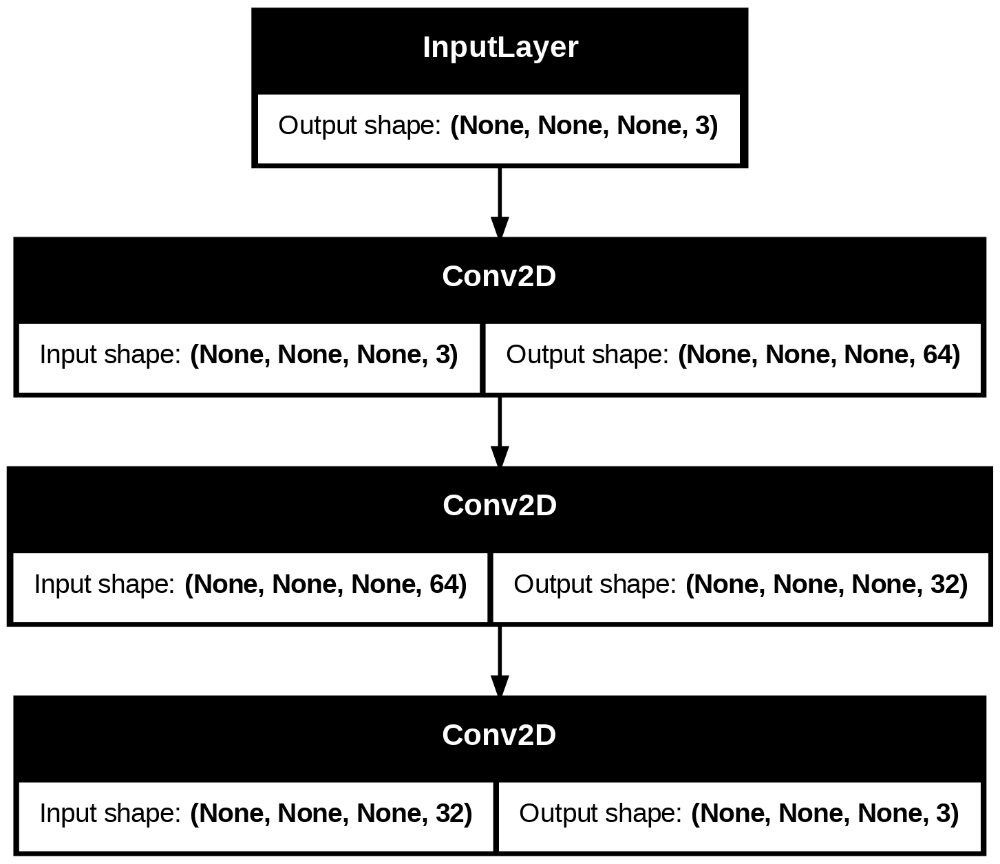

In [22]:
tf.keras.utils.plot_model(model, show_shapes=True,expand_nested=True)

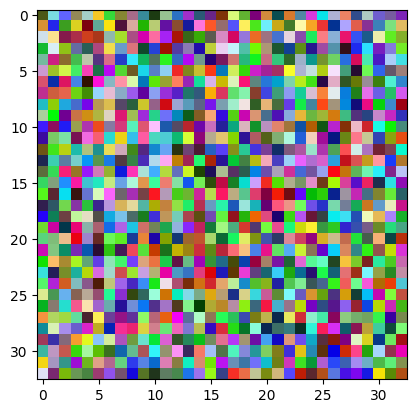

In [23]:
np_image = np.random.rand(1,33,33,3)
plt.imshow(np_image[0])

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


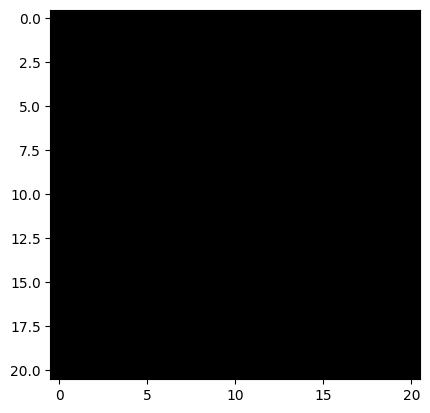

(1, 21, 21, 3)


In [24]:
predicted_image = model.predict(np_image)
plt.imshow(predicted_image[0])
plt.show()
print(predicted_image.shape)

In [25]:
class CustomMSEMetric(Metric):

    def __init__(self, name='mse_metric', **kwargs):
        super().__init__(name=name, **kwargs)
        self.mse = self.add_weight(name='mse', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Ensure y_true and y_pred have the same shape.
        y_true = tf.cast(y_true, self.dtype)
        y_pred = tf.cast(y_pred, self.dtype)
        mse = tf.reduce_mean(tf.square(y_true - y_pred))
        self.mse.assign_add(mse)

    def result(self):
        return self.mse

    def reset_states(self):
        self.mse.assign(0.0)


class PSNR(Metric):
    """
    Peak Signal-to-Noise Ratio (PSNR) metric.
    """
    def __init__(self, name='psnr', max_val=1.0, **kwargs):
        super().__init__(name=name, **kwargs)
        self.mse = self.add_weight(name='mse', initializer='zeros')
        self.max_val = tf.cast(max_val, self.dtype)  # Ensure max_val is same dtype

    @tf.function
    def update_state(self, y_true, y_pred, sample_weight=None):
        # Ensure y_true and y_pred have the same shape.  Very important!
        y_true = tf.cast(y_true, self.dtype)
        y_pred = tf.cast(y_pred, self.dtype)
        mse = tf.reduce_mean(tf.square(y_true - y_pred))
        self.mse.assign_add(mse)

    @tf.function
    def result(self):
        # Avoid log(0) and division by zero
        if self.mse == 0.0:
            return tf.constant(100.0, dtype=self.dtype)  # Return a large value for perfect agreement.
        psnr = 20.0 * tf.math.log(self.max_val) / tf.math.log(10.0) - 10.0 * tf.math.log(self.mse) / tf.math.log(10.0)
        return psnr

    def reset_states(self):
        self.mse.assign(0.0)

In [26]:
1e-2

0.01

In [27]:
# optimizer_layer1 = CustomOptimizer(learning_rate=1e-4)
# optimizer_layer2 = CustomOptimizer(learning_rate=1e-4)
# optimizer_layer3 = CustomOptimizer(learning_rate=1e-5)


optimizer_layer1 = CustomOptimizer(learning_rate=1e-1)
optimizer_layer2 = CustomOptimizer(learning_rate=1e-1)
optimizer_layer3 = CustomOptimizer(learning_rate=15e-2)


custom_mse_loss = CustomMSELoss()


# train_loss = CustomMSEMetric(name='mse_metric')
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_psnr = PSNR(name='psnr')

# test_loss = CustomMSEMetric(name='mse_metric')
test_loss = tf.keras.metrics.Mean(name='test_loss')
test_psnr = PSNR(name='psnr')

In [28]:
for image_lr, image_hr in test_dataset.take(1):
    print(image_lr.shape)
    print(image_hr.shape)


(2048, 33, 33, 3)
(2048, 21, 21, 3)


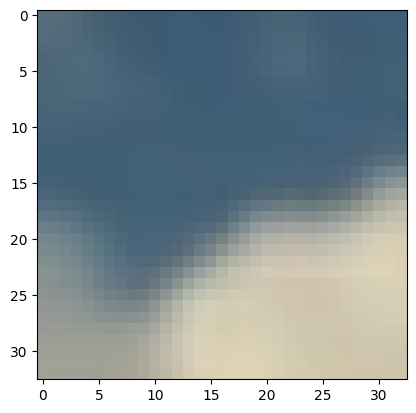

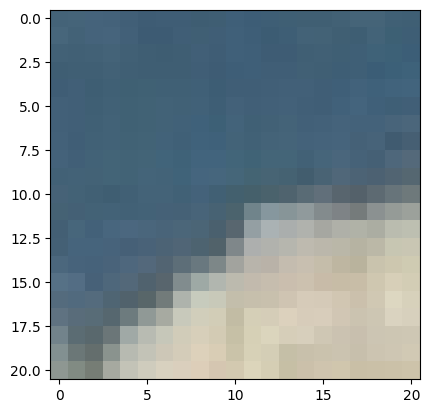

In [29]:
plt.imshow(image_lr[0])
plt.show()
plt.imshow(image_hr[0])
plt.show()

In [30]:
# model.load_weights("/content/drive/MyDrive/deep_learning_research/Image_Super_Resolution_Using_Deep_Convolutional_Networks/models/SRCNN_12.keras")

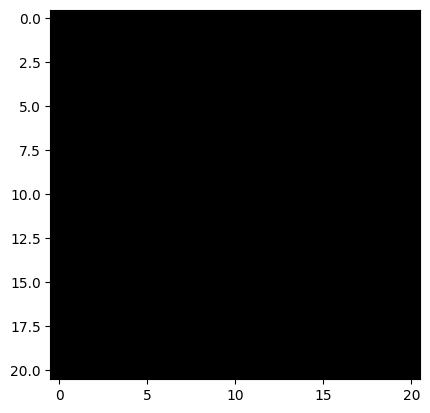

In [31]:
predictions = model(image_lr)

plt.imshow(predictions[0])
plt.show()

In [32]:
loss = custom_mse_loss(image_hr, predictions)
print(loss)

tf.Tensor(0.2406496, shape=(), dtype=float32)


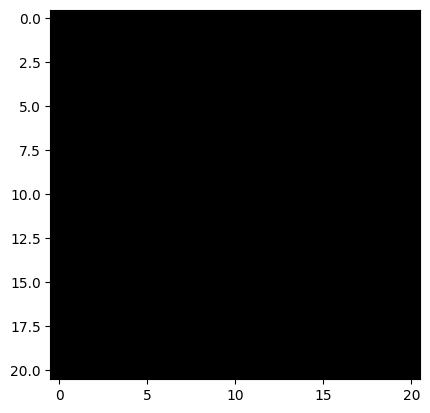

6
(9, 9, 3, 64)
(64,)
(1, 1, 64, 32)
(32,)
(5, 5, 32, 3)
(3,)


In [33]:
with tf.GradientTape() as tape:
    # training=True is only needed if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
    predictions = model(image_lr, training=True)

    plt.imshow(predictions[0])
    plt.show()

    loss = custom_mse_loss(image_hr, predictions)

    gradients = tape.gradient(loss, model.trainable_variables)
    print(len(gradients))

    print(gradients[0].shape)
    print(gradients[1].shape)
    print(gradients[2].shape)
    print(gradients[3].shape)
    print(gradients[4].shape)
    print(gradients[5].shape)


In [34]:
# optimizer_layer1.apply_gradients(zip(gradients[0:2], model.layers[1].trainable_variables))
# optimizer_layer2.apply_gradients(zip(gradients[2:4], model.layers[2].trainable_variables))
# optimizer_layer3.apply_gradients(zip(gradients[4:], model.layers[3].trainable_variables))

In [35]:
# train_loss(loss)

In [36]:
# train_loss.result()

In [37]:
@tf.function
def train_step(images_lr, images_hr):

    with tf.GradientTape() as tape:
    # training=True is only needed if there are layers with different
    # behavior during training versus inference (e.g. Dropout).
        predictions = model(images_lr, training=True)

        loss = custom_mse_loss(images_hr, predictions)


    gradients = tape.gradient(loss, model.trainable_variables)

    optimizer_layer1.apply_gradients(zip(gradients[0:2], model.layers[1].trainable_variables))
    optimizer_layer2.apply_gradients(zip(gradients[2:4], model.layers[2].trainable_variables))
    optimizer_layer3.apply_gradients(zip(gradients[4:], model.layers[3].trainable_variables))


    train_loss(loss)
    train_psnr(images_hr, predictions)


In [38]:
@tf.function
def test_step(images_lr, images_hr):
    predictions = model(images_lr, training=False)
    loss = custom_mse_loss(images_hr, predictions)

    test_loss(loss)
    test_psnr(images_hr, predictions)



In [39]:
def check_prediction(image_path):

    kernel_size = 7
    sigma = 0
    sampling_factor = 3


    full_image = cv2.imread(image_path)
    plt.imshow(full_image[:,:,::-1])
    plt.show()


    full_image_lr = cv2.resize(
                        cv2.GaussianBlur(
                                        full_image, (kernel_size, kernel_size), sigma)[::sampling_factor, ::sampling_factor] ,
                        (full_image.shape[1],full_image.shape[0]) , interpolation=cv2.INTER_CUBIC)


    plt.imshow(full_image_lr[:,:,::-1])
    plt.show()


    predction = model.predict(np.array([full_image_lr])/255.0)[0][:,:,::-1]

    plt.imshow(predction)
    plt.show()

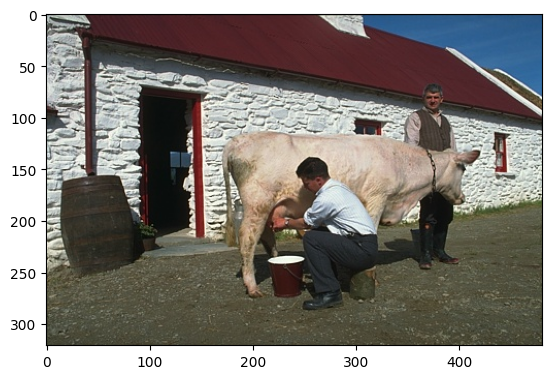

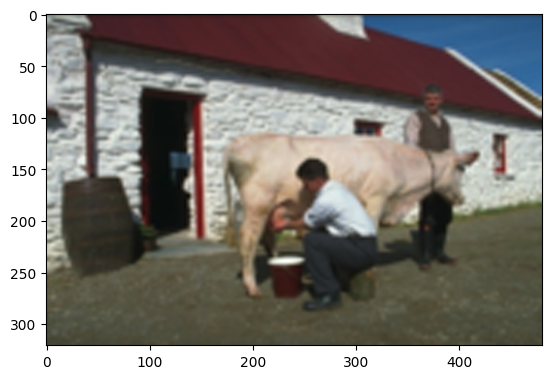

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 709ms/step


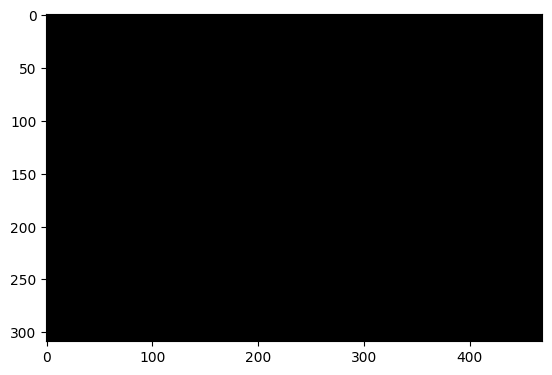

In [40]:
original_test_images_path = glob.glob("/content/BSDS300/images/test/*.jpg")

random_image_path = random.choice(original_test_images_path)

check_prediction(random_image_path)

Epoch 1/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0737 Train PSNR: -6.8691
Test Loss: 0.0604 Test PSNR: -2.9947


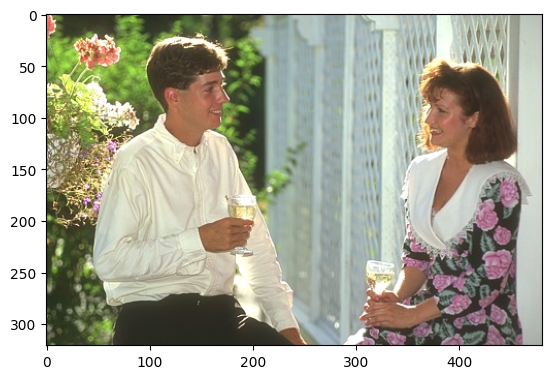

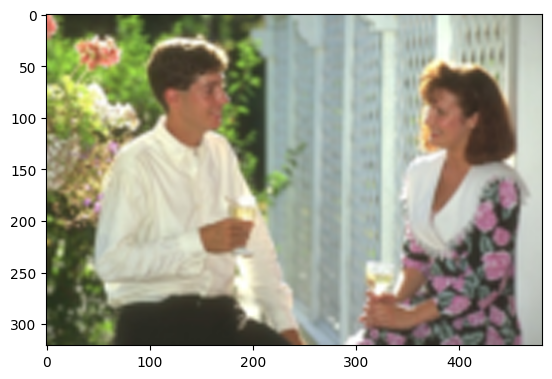

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step


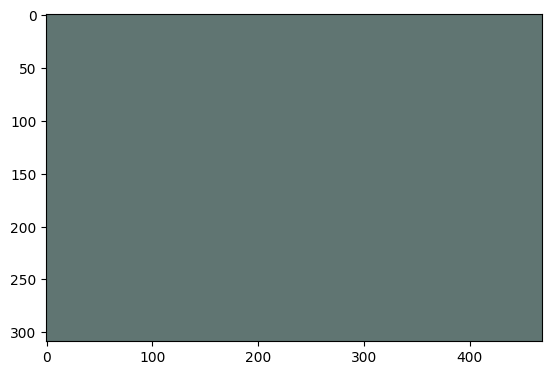

Epoch 2/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0590 Train PSNR: -5.9055
Test Loss: 0.0601 Test PSNR: -2.9739


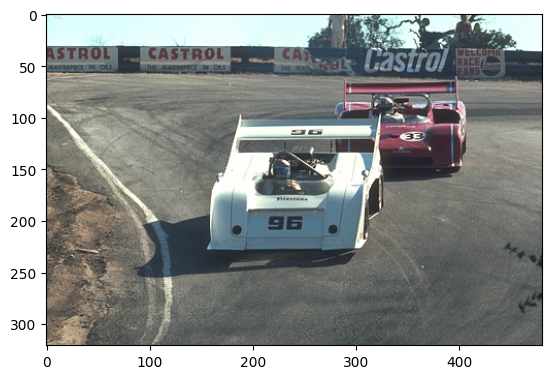

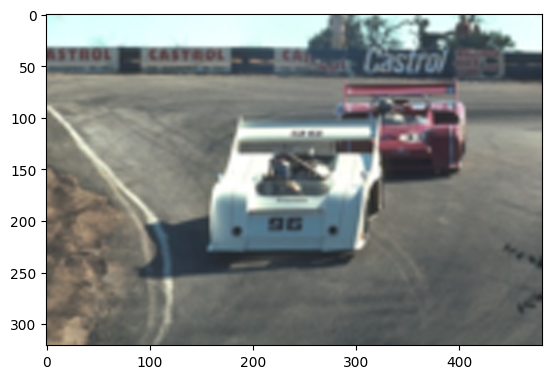

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step


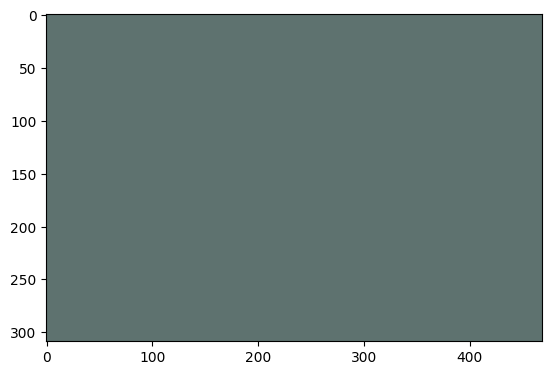

Epoch 3/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0413 Train PSNR: -4.3548
Test Loss: 0.0126 Test PSNR: 3.8178


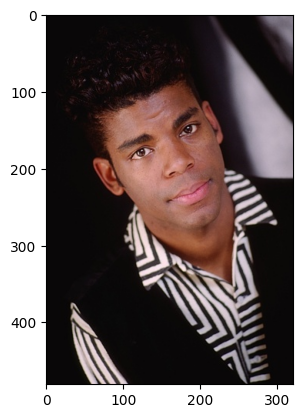

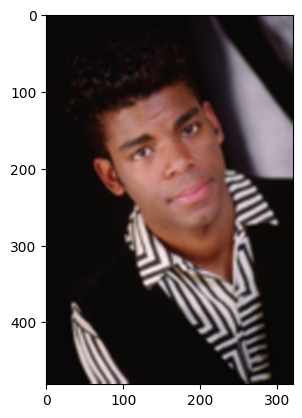

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


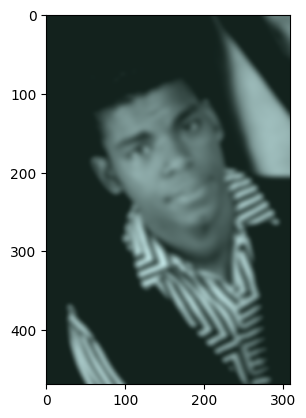

Epoch 4/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0131 Train PSNR: 0.6310
Test Loss: 0.0108 Test PSNR: 4.4672


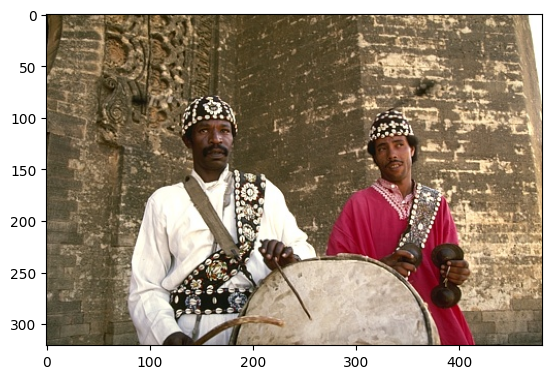

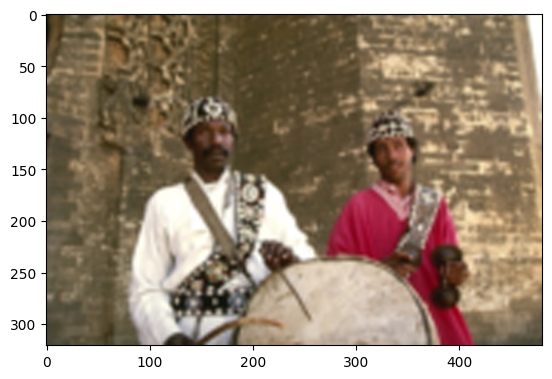

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


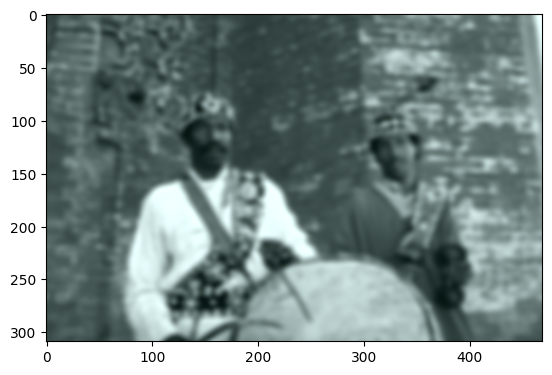

Epoch 5/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0120 Train PSNR: 0.9993
Test Loss: 0.0103 Test PSNR: 4.7003


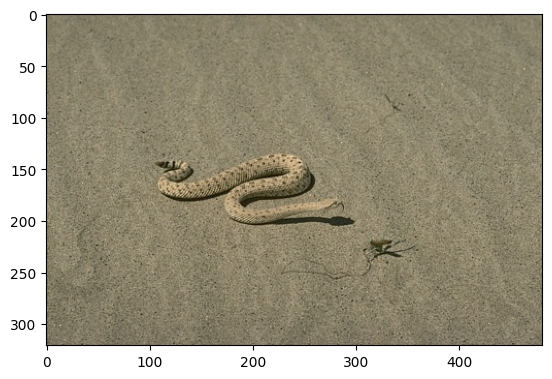

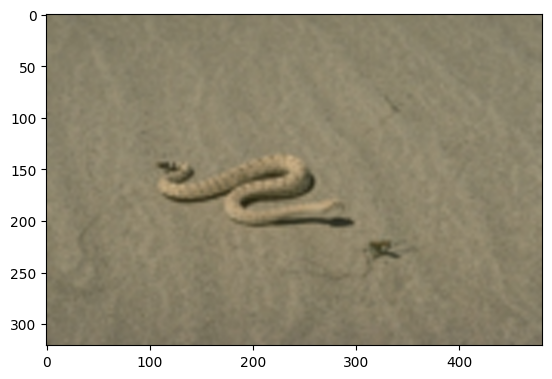

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step


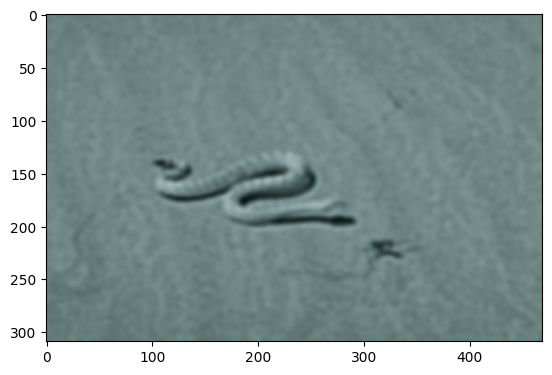

Epoch 6/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0117 Train PSNR: 1.1315
Test Loss: 0.0100 Test PSNR: 4.8100


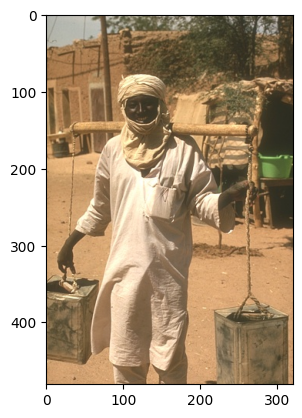

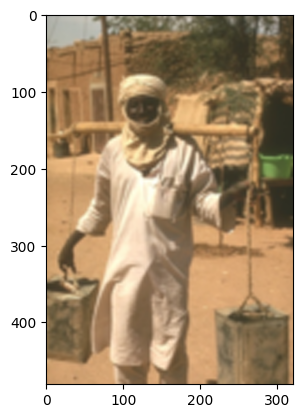

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


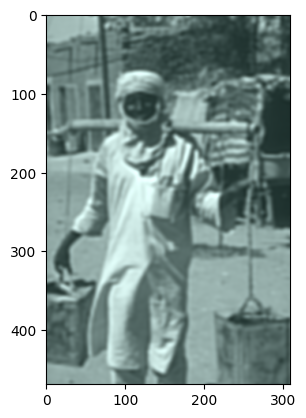

Epoch 7/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0115 Train PSNR: 1.1868
Test Loss: 0.0100 Test PSNR: 4.8305


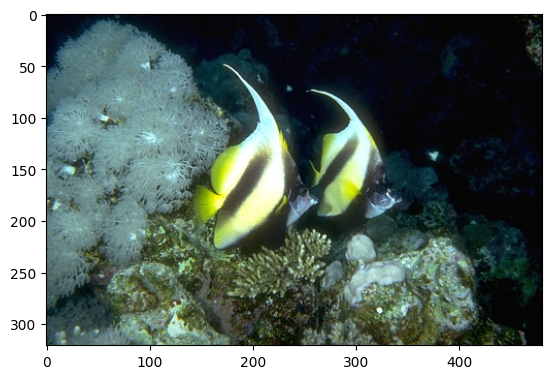

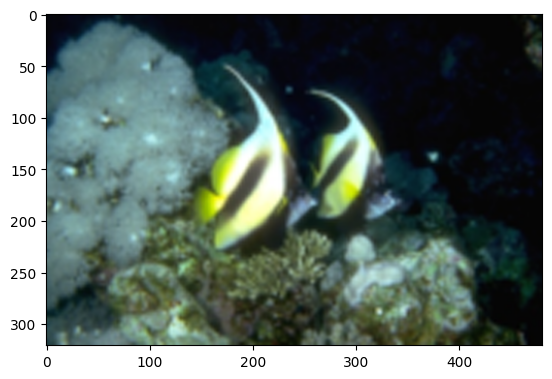

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


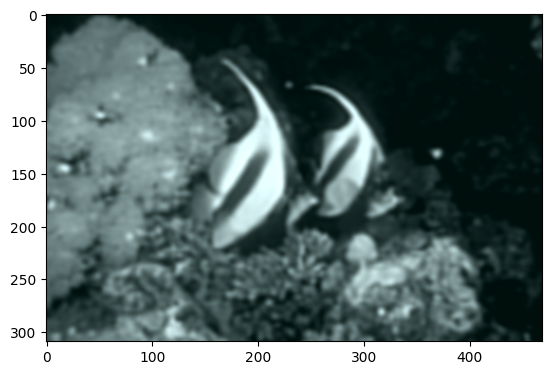

Epoch 8/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0105 Train PSNR: 1.5789
Test Loss: 0.0058 Test PSNR: 7.1857


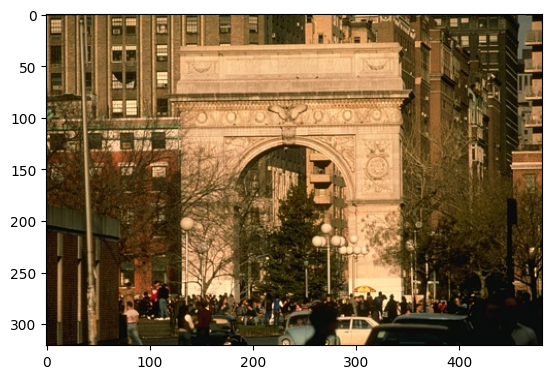

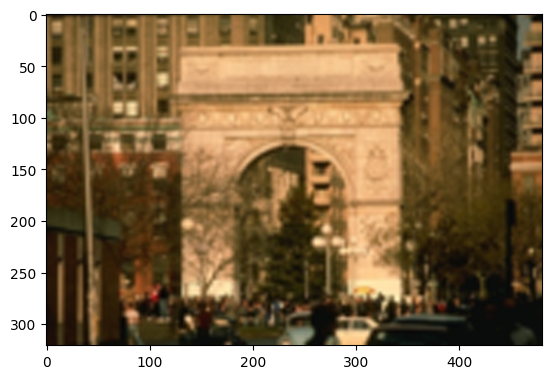

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


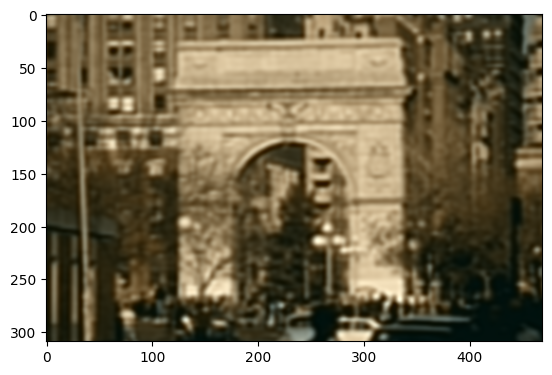

Epoch 9/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0056 Train PSNR: 4.3223
Test Loss: 0.0054 Test PSNR: 7.4681


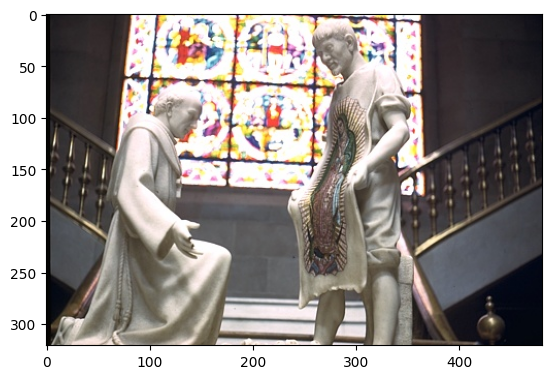

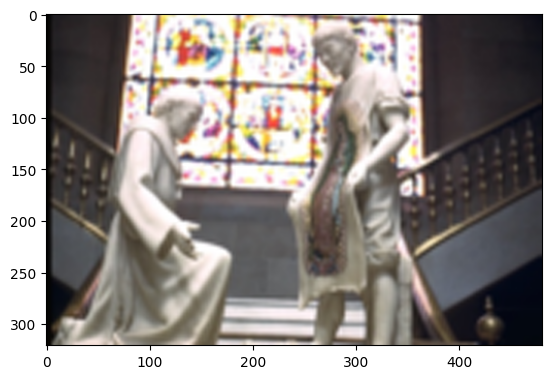

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


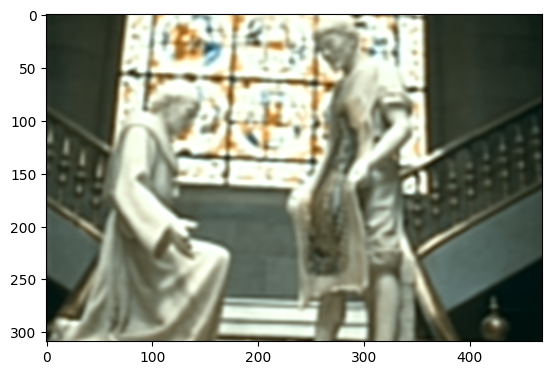

Epoch 10/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0054 Train PSNR: 4.4589
Test Loss: 0.0053 Test PSNR: 7.5714


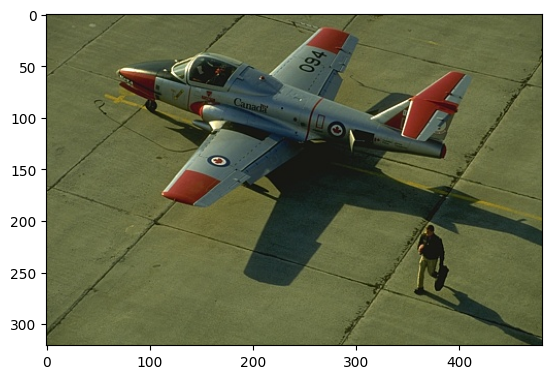

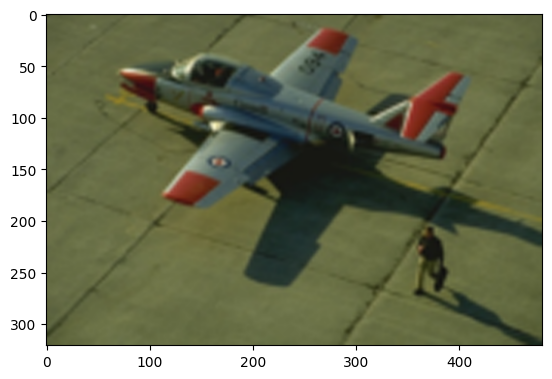

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


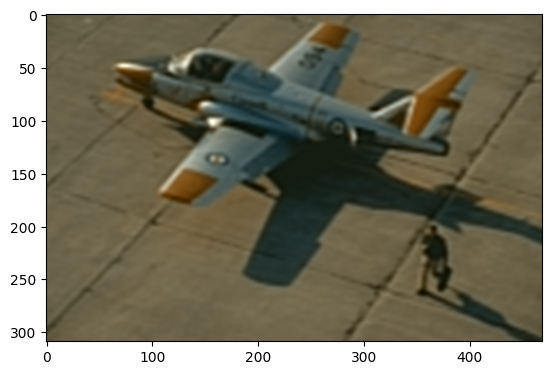

Epoch 11/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0054 Train PSNR: 4.4954
Test Loss: 0.0053 Test PSNR: 7.5944


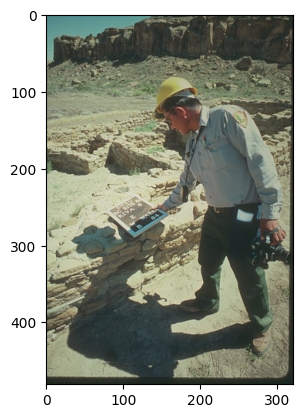

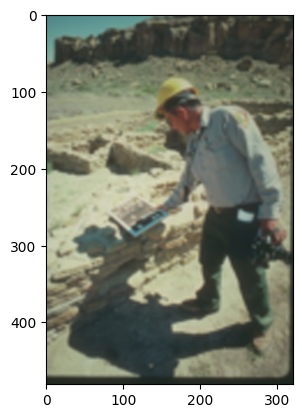

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step


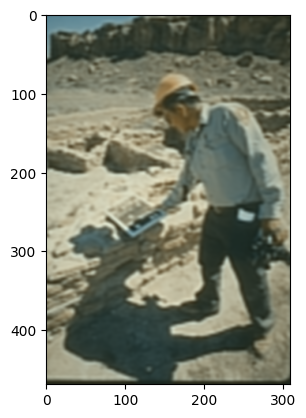

Epoch 12/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0053 Train PSNR: 4.5288
Test Loss: 0.0052 Test PSNR: 7.6331


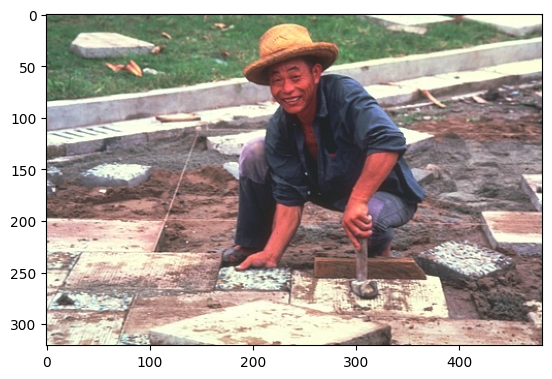

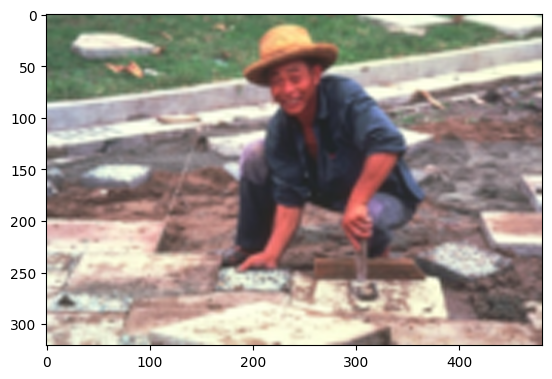

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step


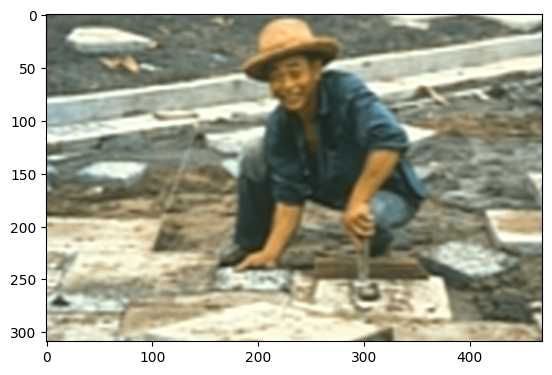

Epoch 13/13


Training loop:   0%|          | 0/66 [00:00<?, ?it/s]

Testing loop:   0%|          | 0/33 [00:00<?, ?it/s]

Train Loss: 0.0053 Train PSNR: 4.5470
Test Loss: 0.0052 Test PSNR: 7.6479


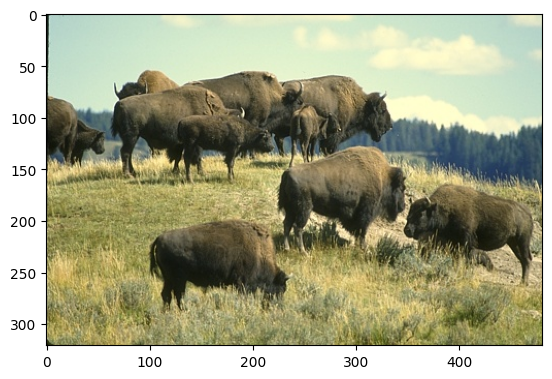

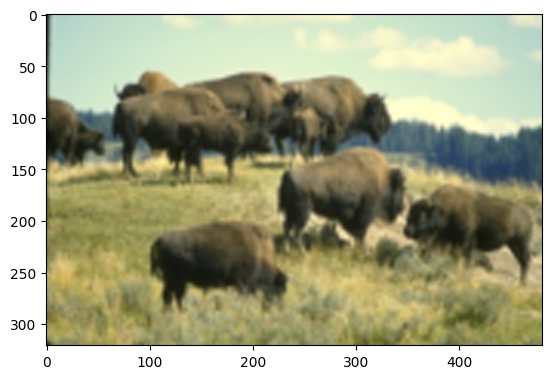

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step


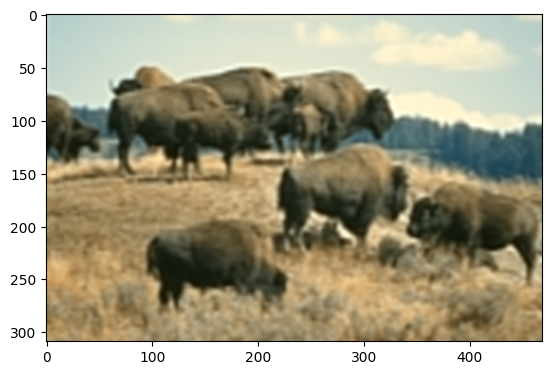

In [41]:
# EPOCHS = 500
EPOCHS = 13



for epoch in range(EPOCHS):
    print(f"Epoch {epoch+1}/{EPOCHS}")
    train_loss.reset_state()
    train_psnr.reset_states()
    test_loss.reset_state()
    test_psnr.reset_states()

    for images_lr, images_hr in tqdm(train_dataset,desc="Training loop"):
        train_step(images_lr, images_hr)

    for images_lr, images_hr in tqdm(test_dataset,desc="Testing loop"):
        test_step(images_lr, images_hr)


    print(f"Train Loss: {train_loss.result():.4f} Train PSNR: {train_psnr.result():.4f}")
    print(f"Test Loss: {test_loss.result():.4f} Test PSNR: {test_psnr.result():.4f}")

    if epoch%3 == 0:
        model.save(f'/content/drive/MyDrive/deep_learning_research/Image_Super_Resolution_Using_Deep_Convolutional_Networks/models/SRCNN_{epoch}.keras')



    random_image_path = random.choice(original_test_images_path)
    check_prediction(random_image_path)

In [ ]:
# os.listdir("/content/BSDS300/images/test")

In [42]:
glob.glob("/content/dataset/test/*lr.jpg")[0]

'/content/dataset/test/11_20_101087_lr.jpg'

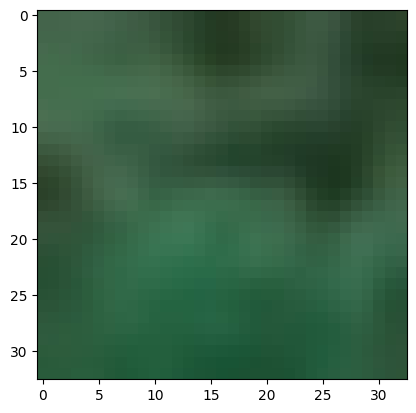

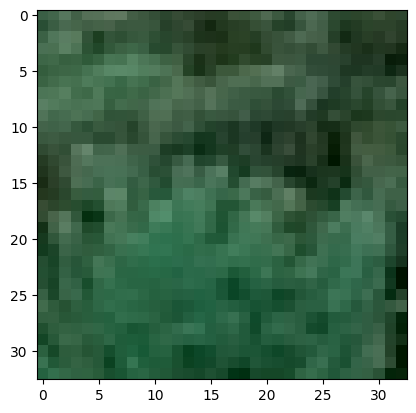

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step


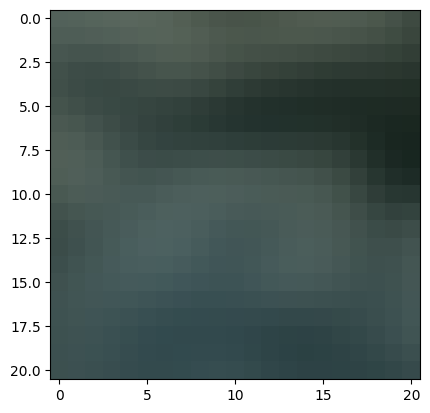

In [43]:
image_lr = cv2.imread("/content/dataset/test/11_20_101087_lr.jpg")
image_hr = cv2.imread("/content/dataset/test/11_20_101087_hr.jpg")


plt.imshow(image_lr)
plt.show()
plt.imshow(image_hr)
plt.show()




predction = model.predict(np.array([image_lr])/255.0)[0]

plt.imshow(predction)
plt.show()

# Visualise layers and their output

## Visualise kernels of each layer

Layer 3 kernels


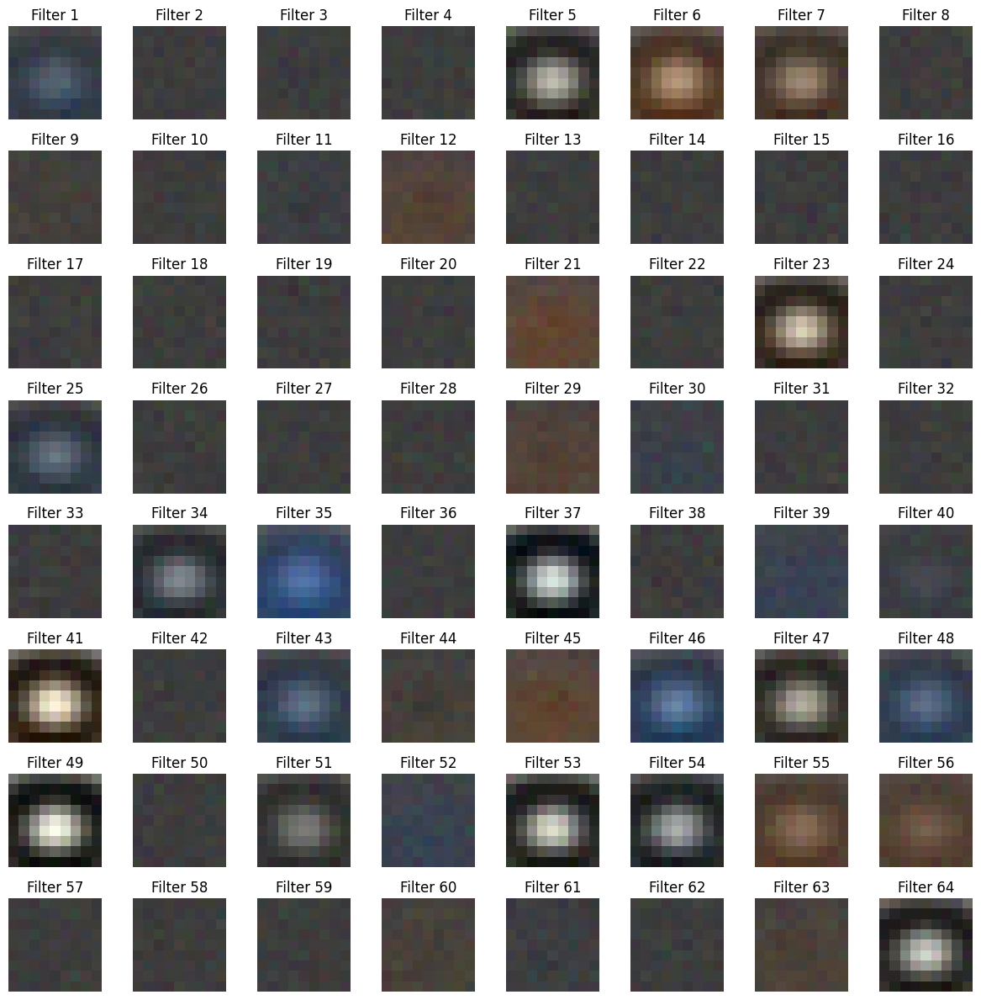

In [56]:
print(f"Layer {i} kernels")

kernels = model.layers[1].kernel.numpy() # shape: (9, 9, 3, 64)

# kernel size = 9,9,3 and 64 filters

# Normalize kernels to 0–1 range for better visualization
kernels_min = kernels.min()
kernels_max = kernels.max()
kernels = (kernels - kernels_min) / (kernels_max - kernels_min)

# Plot each 9x9x3 filter as an RGB image
num_filters = kernels.shape[3]
cols = 8
rows = num_filters // cols + int(num_filters % cols != 0)

plt.figure(figsize=(cols * 1.5, rows * 1.5))
for i in range(num_filters):
    f = kernels[:, :, :, i]  # shape: (9, 9, 3)
    plt.subplot(rows, cols, i + 1)
    plt.imshow(f)
    plt.axis('off')
    plt.title(f'Filter {i+1}')
plt.tight_layout()
plt.show()

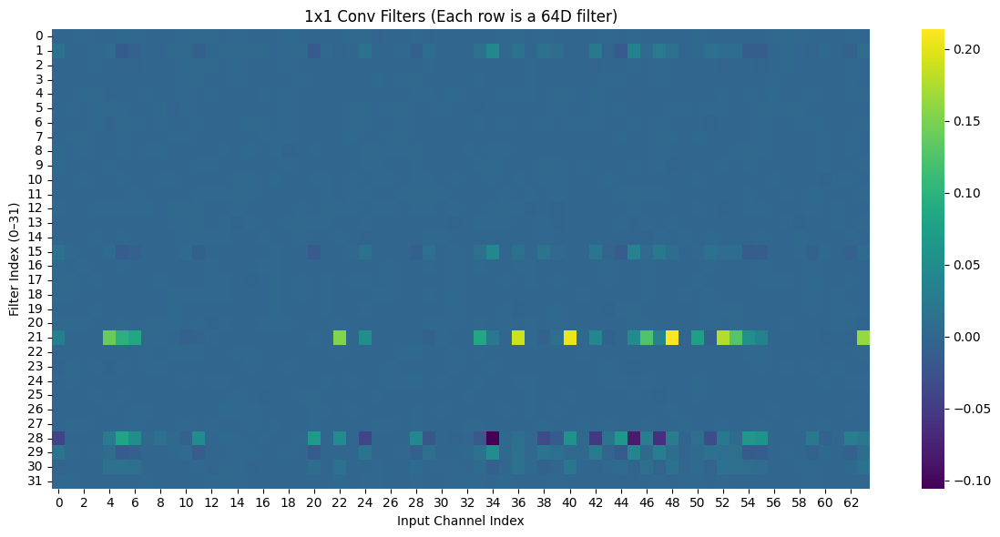

In [59]:

kernels = model.layers[2].kernel.numpy()  # shape: (1, 1, 64, 32)
kernels = np.squeeze(kernels, axis=(0, 1))  # shape: (64, 32)

# kernel size = 1,1,64 and 32 filters

# Transpose for easier visualization: shape -> (32, 64)
kernels = kernels.T

plt.figure(figsize=(12, 6))
sns.heatmap(kernels, cmap='viridis', cbar=True)
plt.xlabel('Input Channel Index')
plt.ylabel('Filter Index (0–31)')
plt.title('1x1 Conv Filters (Each row is a 64D filter)')
plt.tight_layout()
plt.show()

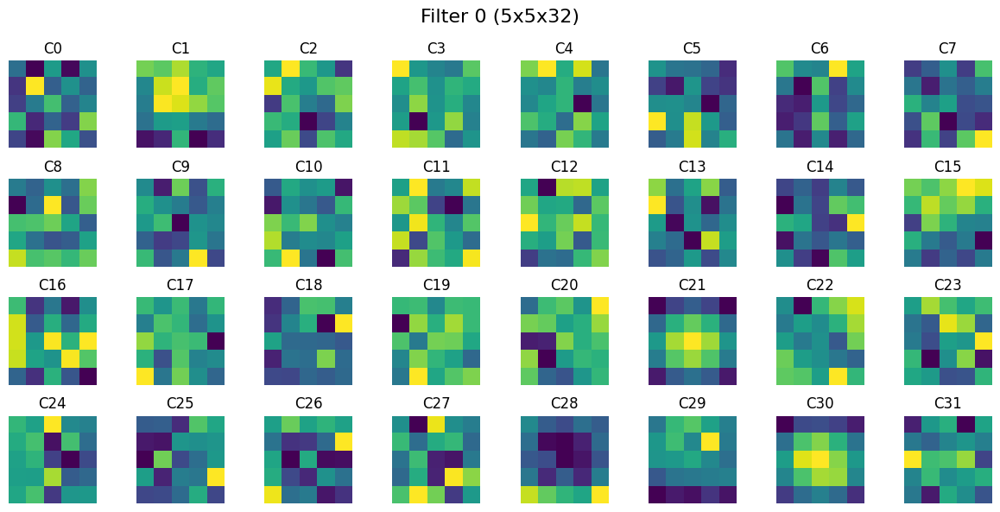

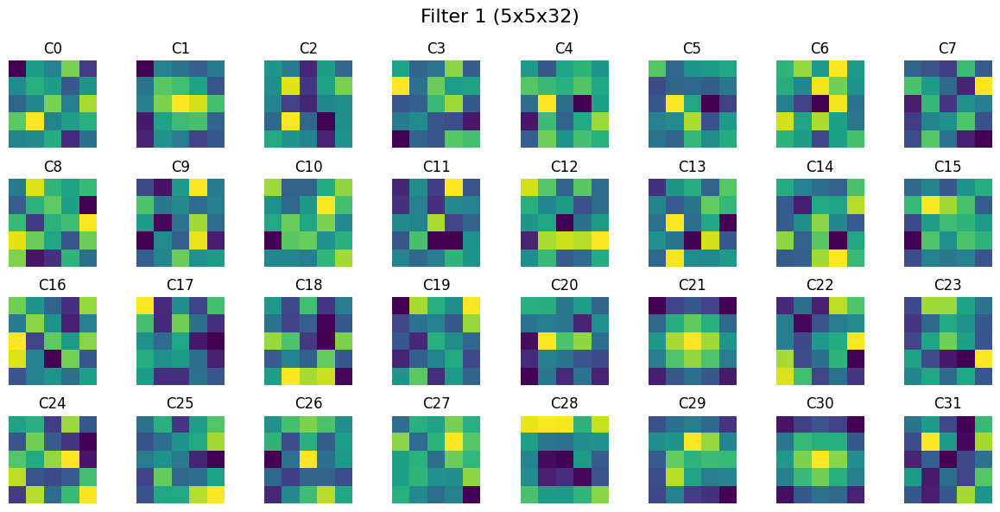

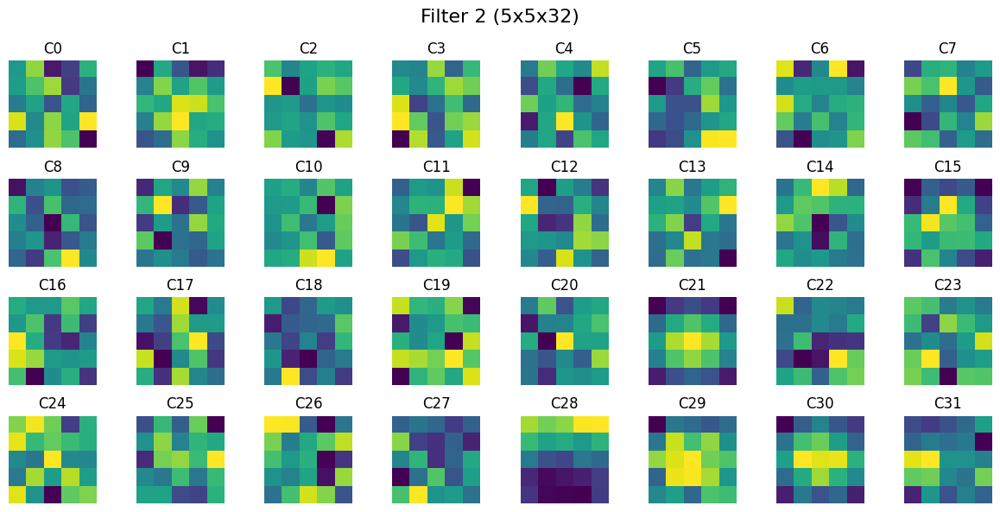

In [61]:
kernels = model.layers[3].kernel.numpy()  # shape: (5, 5, 32, 3)

# kernel size = 5,5,32 and 3 filters

# Loop through each filter (output channel)
for f_idx in range(3):
    filter_kernels = kernels[:, :, :, f_idx]  # shape: (5, 5, 32)
    filter_kernels = np.moveaxis(filter_kernels, -1, 0)  # (32, 5, 5)

    # Plot 32 channel slices
    fig, axes = plt.subplots(4, 8, figsize=(12, 6))
    fig.suptitle(f'Filter {f_idx} (5x5x32)', fontsize=16)
    for i, ax in enumerate(axes.flat):
        ax.imshow(filter_kernels[i], cmap='viridis')
        ax.set_title(f'C{i}')
        ax.axis('off')
    plt.tight_layout()
    plt.subplots_adjust(top=0.88)
    plt.show()

## Visulalise output from each layers

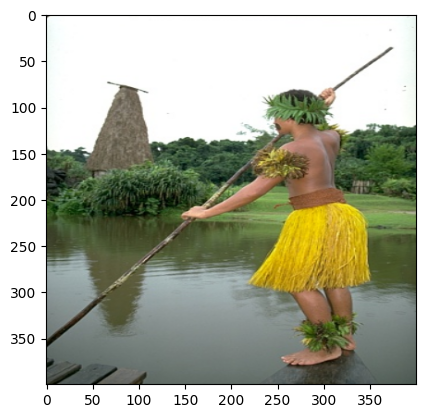

In [74]:
def load_image(path):
    img = cv2.imread(path)
    img = cv2.resize(img, (400, 400))
    img_array = np.array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return img_array / 255.0  # Normalize

def get_intermediate_models(model):
    layer_outputs = [layer.output for layer in model.layers if 'conv2d' in layer.name]
    return Model(inputs=model.input, outputs=layer_outputs)


def get_feature_maps(intermediate_model, input_image):
    return intermediate_model.predict(input_image)


def plot_feature_maps(feature_maps, layer_names):
    for fmap, layer_name in zip(feature_maps, layer_names):
        n_features = fmap.shape[-1]  # 64, 32, or 3
        size = fmap.shape[1] # 92 or 88

        # Create a grid to display all feature maps
        n_cols = int(np.sqrt(n_features))
        n_rows = int(np.ceil(n_features / n_cols))

        display_grid = np.zeros((n_rows * size, n_cols * size))

        for i in range(n_features):
            row = i // n_cols
            col = i % n_cols
            channel_image = fmap[0, :, :, i]

            # mean = 0 and std = 1
            channel_image -= channel_image.mean()
            channel_image /= (channel_image.std() + 1e-5)

            # increase contrast
            channel_image *= 64

            # remove negative values
            channel_image += 128

            # Clip values from 0-255
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[row * size : (row + 1) * size,
                         col * size : (col + 1) * size] = channel_image

        scale = 1. / size
        plt.figure(figsize=(scale * display_grid.shape[1],
                            scale * display_grid.shape[0]))
        plt.title(f'Feature maps of layer: {layer_name}')
        plt.grid(False)
        plt.imshow(display_grid, aspect='auto', cmap='viridis')
        plt.axis('off')
        plt.show()



plt.imshow(load_image("/content/BSDS300/images/test/101087.jpg")[0])
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 211ms/step


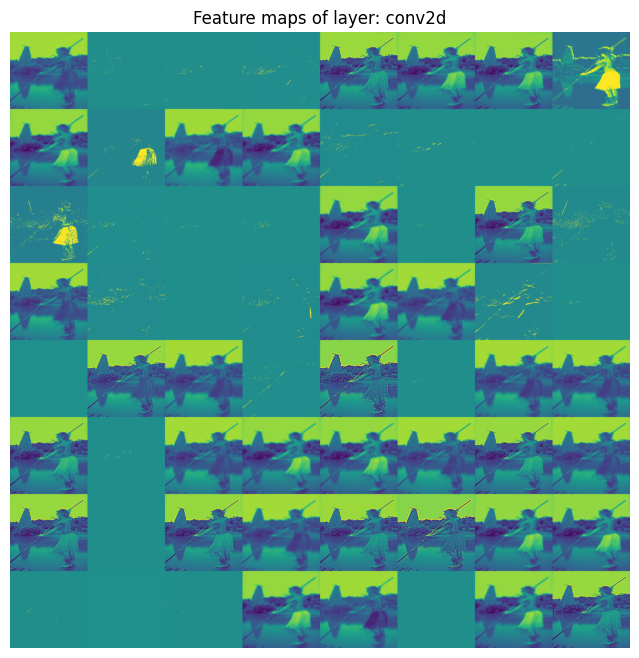

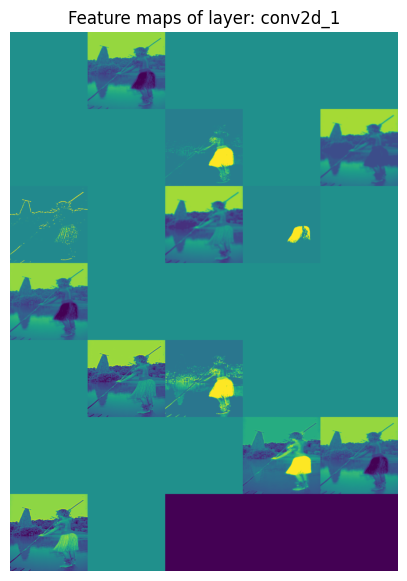

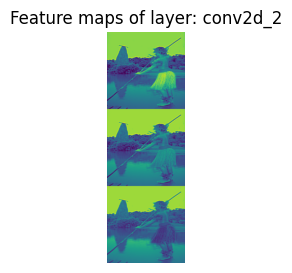

In [75]:
# Load image
img = load_image("/content/BSDS300/images/test/101087.jpg")

# Get intermediate outputs
intermediate_model = get_intermediate_models(model)
feature_maps = get_feature_maps(intermediate_model, img)

# Plot them
conv_layer_names = [layer.name for layer in model.layers if 'conv2d' in layer.name]
plot_feature_maps(feature_maps, conv_layer_names)

In [ ]:
# print("Trainable variables in the model:")
# for var in model.trainable_variables:
#     print(var.name)

In [ ]:
# print(f"Layer 0 trainable variables: {len(model.layers[0].trainable_variables)}")
# print(f"Layer 0 trainable variables: {len(model.layers[1].trainable_variables)}")
# print(f"Layer 1 trainable variables: {len(model.layers[2].trainable_variables)}")
# print(f"Layer 2 trainable variables: {len(model.layers[3].trainable_variables)}")

In [ ]:
# custom_mse_loss = CustomMSELoss()



#             # Compile the model with different learning rate for each layer


#             optimizer_layer1 = CustomOptimizer(learning_rate=1e-4)
#             optimizer_layer2 = CustomOptimizer(learning_rate=1e-4)
#             optimizer_layer3 = CustomOptimizer(learning_rate=1e-5)

#             model.compile(optimizer=CustomOptimizer(learning_rate=1e-4), loss='mse') #  Good practice to compile